In [1]:
model = !nvidia-smi
print('GPU : ', model[8])
print('Memory : ', model[9])

GPU :  |   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
Memory :  | N/A   61C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing Libraries

In [3]:
import os
import glob
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.datasets as datasets
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image
from tqdm import tqdm
import torchvision.transforms as transforms
import torch.nn.utils.spectral_norm as spectral_norm
from torchvision.models import resnet18
from torch.autograd import Variable
from scipy.linalg import sqrtm

import time
import datetime
import matplotlib.pyplot as plt
from PIL import Image

import numpy as np
import pandas as pd
import skimage.io as io
import sys

In [4]:
print(f'Numpy version: {np.version.version}')
print(f'PyTorch version: {torch.__version__}')

Numpy version: 1.19.5
PyTorch version: 1.9.0+cu102


In [5]:
# python version
!python --version

Python 3.7.10


In [6]:
root_dir = '/content/drive/MyDrive/I2IT/facades'
train_dir = root_dir + '/train'
val_dir = root_dir + '/val'

In [7]:
files = os.listdir(train_dir)
print(f'Number of images in training set: {len(files)}')

Number of images in training set: 400


(256, 512, 3)


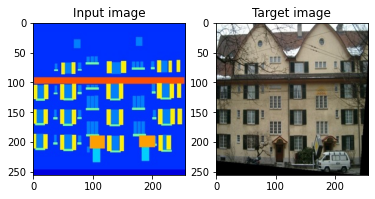

In [8]:
# Visualizing one paired image randomly from the train set
idx = np.random.randint(0, len(files))
img = io.imread(os.path.join(train_dir, files[idx]))
print(img.shape)

img_input = img[:,256:,:]
img_target = img[:,:256,:]

plt.subplot(121)
plt.title('Input image')
plt.imshow(img_input)

plt.subplot(122)
plt.title('Target image')
plt.imshow(img_target)
plt.show()

## Hyperparameter Configuration

In [27]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 0.0002
BATCH_SIZE = 8
NUM_WORKERS = 2
IMAGE_SIZE = 128
CHANNELS_IMG = 3
L1_LAMBDA = 100
NUM_EPOCHS = 100
LATENT_DIM = 8
B1 = 0.5
B2 = 0.999
CHECKPOINT_DISC = "disc.pth.tar"
CHECKPOINT_GEN = "gen.pth.tar"
CHECKPOINT_ENC = "enc.pth.tar"
output_path = root_dir + '/outputs'

In [10]:
# function to clear folder which contains generated images per epoch per batch
def clear_folder(folder_path):
  try:
    os.makedirs(folder_path)
  except OSError as _e:
    pass
  for the_file in os.listdir(folder_path):
    _file_path = os.path.join(folder_path, the_file)
    try:
      if os.path.isfile(_file_path):
        os.unlink(_file_path)
      elif os.path.isdir(_file_path):
        shutil.rmtree(_file_path)
    except OSError as _e:
      print(_e)

clear_folder(output_path)

## Build Custom Dataset

In [12]:
class FacadesDataset(Dataset):
  def __init__(self, root_dir, input_shape, mode="train"):
    self.transform = transforms.Compose(
        [
            transforms.Resize(input_shape[-2:], Image.BICUBIC),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
        ]
    )

    self.files = sorted(glob.glob(os.path.join(root_dir, mode) + "/*.*"))

  def __len__(self):
    return len(self.files)

  def __getitem__(self, index):
    img = Image.open(self.files[index % len(self.files)])
    w, h = img.size
    img_A = img.crop((w / 2, 0, w, h))
    img_B = img.crop((0, 0, w / 2, h))

    if np.random.random() < 0.5:
        img_A = Image.fromarray(np.array(img_A)[:, ::-1, :], "RGB")
        img_B = Image.fromarray(np.array(img_B)[:, ::-1, :], "RGB")

    img_A = self.transform(img_A)
    img_B = self.transform(img_B)

    return img_A, img_B

In [ ]:
train_dataset = FacadesDataset(root_dir=root_dir, input_shape=(CHANNELS_IMG,IMAGE_SIZE,IMAGE_SIZE))

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=8,
)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
x,y = next(iter(train_loader))
print(x.shape)
print(y.shape)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


torch.Size([8, 3, 128, 128])
torch.Size([8, 3, 128, 128])


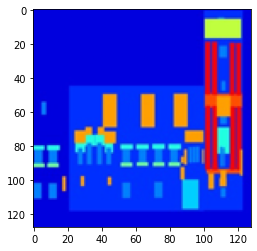

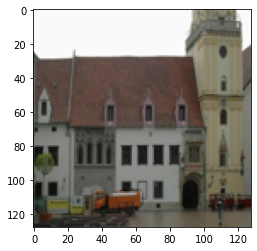

In [ ]:
input_img = np.array(x[0]).transpose(1,2,0)
target_img = np.array(y[0]).transpose(1,2,0)
input_img = input_img * 0.5 + 0.5
target_img = target_img * 0.5 + 0.5

plt.imshow(input_img)
plt.show()
plt.imshow(target_img)
plt.show()

In [13]:
# Functions to save checkpoint and load checkpoint
def save_checkpoint(model, optimizer, epoch, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, output_path + f'/{epoch}' + filename)


def load_checkpoint(checkpoint_file, model, optimizer, epoch, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(output_path + f'/{epoch}' + checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    for param_group in optimizer.param_groups:
      param_group["lr"] = lr

## Weights Initialization

In [14]:
def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find("Conv") != -1:
    torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find("BatchNorm2d") != -1:
    torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
    torch.nn.init.constant_(m.bias.data, 0.0)

## Building Generator Architecture

In [15]:
class UNetDown(nn.Module):
  def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
    super(UNetDown, self).__init__()
    layers = [nn.Conv2d(in_size, out_size, 3, stride=2, padding=1, bias=False)]
    if normalize:
      layers.append(nn.BatchNorm2d(out_size, 0.8))
    layers.append(nn.LeakyReLU(0.2))
    self.model = nn.Sequential(*layers)

  def forward(self, x):
    return self.model(x)


class UNetUp(nn.Module):
  def __init__(self, in_size, out_size):
    super(UNetUp, self).__init__()
    self.model = nn.Sequential(
        nn.Upsample(scale_factor=2),
        nn.Conv2d(in_size, out_size, 3, stride=1, padding=1, bias=False),
        nn.BatchNorm2d(out_size, 0.8),
        nn.ReLU(inplace=True),
    )

  def forward(self, x, skip_input):
    x = self.model(x)
    x = torch.cat((x, skip_input), 1)
    return x

class Generator(nn.Module):
  def __init__(self, latent_dim, img_shape):
    super(Generator, self).__init__()
    channels, self.h, self.w = img_shape

    self.fc = nn.Linear(latent_dim, self.h * self.w)

    self.down1 = UNetDown(channels + 1, 64, normalize=False)
    self.down2 = UNetDown(64, 128)
    self.down3 = UNetDown(128, 256)
    self.down4 = UNetDown(256, 512)
    self.down5 = UNetDown(512, 512)
    self.down6 = UNetDown(512, 512)
    self.down7 = UNetDown(512, 512, normalize=False)
    self.up1 = UNetUp(512, 512)
    self.up2 = UNetUp(1024, 512)
    self.up3 = UNetUp(1024, 512)
    self.up4 = UNetUp(1024, 256)
    self.up5 = UNetUp(512, 128)
    self.up6 = UNetUp(256, 64)

    self.final = nn.Sequential(
        nn.Upsample(scale_factor=2), nn.Conv2d(128, channels, 3, stride=1, padding=1), nn.Tanh()
    )

  def forward(self, x, z):
    # Propogate noise through fc layer and reshape to img shape
    z = self.fc(z).view(z.size(0), 1, self.h, self.w)
    d1 = self.down1(torch.cat((x, z), 1))
    d2 = self.down2(d1)
    d3 = self.down3(d2)
    d4 = self.down4(d3)
    d5 = self.down5(d4)
    d6 = self.down6(d5)
    d7 = self.down7(d6)
    u1 = self.up1(d7, d6)
    u2 = self.up2(u1, d5)
    u3 = self.up3(u2, d4)
    u4 = self.up4(u3, d3)
    u5 = self.up5(u4, d2)
    u6 = self.up6(u5, d1)

    return self.final(u6)

In [16]:
## Testing generator architecture
Tensor = torch.FloatTensor
input_shape = (CHANNELS_IMG, IMAGE_SIZE, IMAGE_SIZE)
X = torch.randn(1,3,128,128)
Z = Variable(Tensor(np.random.normal(0,1, (X.shape[0], LATENT_DIM))))
gen = Generator(LATENT_DIM, input_shape)
output = gen(X, Z)
print(output.shape)

torch.Size([1, 3, 128, 128])


## Building Discriminator Architecture

In [17]:
class CNNBlock(nn.Module):
  def __init__(self, in_channels, out_channels, stride):
    super(CNNBlock, self).__init__()
    self.conv = nn.Sequential(
      spectral_norm(nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=False, padding_mode="reflect")),
      nn.LeakyReLU(0.2),
    )

  def forward(self, x):
    return self.conv(x)


class Discriminator(nn.Module):
  def __init__(self, in_channels=3, features=[64, 128, 256]):
    super().__init__()
    self.initial = nn.Sequential(
      nn.Conv2d(
          in_channels * 2,
          features[0],
          kernel_size=4,
          stride=2,
          padding=1,
          padding_mode="reflect",
      ),
      nn.LeakyReLU(0.2),
    )

    layers = []
    in_channels = features[0]
    for feature in features[1:]:
      layers.append(
          CNNBlock(in_channels, feature, stride=1 if feature == features[-1] else 2),
      )
      in_channels = feature

    layers.append(
      nn.Conv2d(
          in_channels, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect"
      ),
    )

    self.model = nn.Sequential(*layers)

  def forward(self, x, y):
    x = torch.cat([x, y], dim=1)
    x = self.initial(x)
    x = self.model(x)
    return x

In [18]:
## Testing Discriminator architecture
disc = Discriminator()
X = torch.randn(1,3,128,128)
Y = torch.randn(1,3,128,128)
output = disc(X,Y)
print(output.shape)

torch.Size([1, 1, 30, 30])


## Building Encoder Architecture

In [19]:
class Encoder(nn.Module):
  def __init__(self, in_channels=3,latent_dim=LATENT_DIM):
    super(Encoder, self).__init__()
    self.conv1 = nn.Conv2d(in_channels+1, 4, 3,2,1)
    self.conv2 = nn.Conv2d(4, 8, 3,2,1)
    self.conv3 = nn.Conv2d(8, 16, 3,2,1)
    self.conv4 = nn.Conv2d(16, 32, 3,2,1)

    self.pool = nn.MaxPool2d(2,2)
    self.relu = nn.ReLU()

    self.h, self.w = IMAGE_SIZE, IMAGE_SIZE
    self.fc = nn.Linear(latent_dim, self.h * self.w)

  def forward(self, x, z):
    z = self.fc(z).view(z.size(0), 1, self.h, self.w)
    x = torch.cat((x, z), 1)
    x = self.relu(self.conv1(x))
    x = self.pool(x)
    x = self.relu(self.conv2(x))
    x = self.pool(x)
    x = self.relu(self.conv3(x))
    x = self.pool(x)
    x = self.relu(self.conv4(x))
    x = x.view(x.size(0), -1)
    return x

In [23]:
# Testing encoder
enc = Encoder().to(DEVICE)
X = torch.randn(BATCH_SIZE,CHANNELS_IMG,IMAGE_SIZE,IMAGE_SIZE).to(DEVICE)
Z = Variable(Tensor(np.random.normal(0,1, (X.shape[0], LATENT_DIM)))).to(DEVICE)
output = enc(X,Z)
print(output.shape)

torch.Size([8, 32])


In [24]:
input_shape = (CHANNELS_IMG, IMAGE_SIZE, IMAGE_SIZE)
gen = Generator(LATENT_DIM, input_shape).to(DEVICE)
disc = Discriminator().to(DEVICE)
enc = Encoder().to(DEVICE)

# Defining loss
L1 = nn.L1Loss()

# Defining optimizers
optimizer_G = torch.optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(B1, B2))
optimizer_D = torch.optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(B1, B2))
optimizer_E = torch.optim.Adam(enc.parameters(), lr=LEARNING_RATE, betas=(B1, B2))

In [25]:
## Loading dataset in pytorch's dataloader

train_dataset = FacadesDataset(root_dir=root_dir, input_shape=(CHANNELS_IMG,IMAGE_SIZE,IMAGE_SIZE))
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=8,
)

val_dataset = FacadesDataset(root_dir=root_dir, input_shape=(CHANNELS_IMG,IMAGE_SIZE,IMAGE_SIZE), mode='val')
val_loader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=True,
    num_workers=1,
)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:281: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [26]:
def sample_images(epoch):
  gen.eval()
  img_samples = None

  for i, (x,y) in enumerate(val_loader):
    x = Variable(x).to(DEVICE)
    y_real = Variable(y).to(DEVICE)

    sampled_z1 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake1 = gen(x, sampled_z1)[0]    
    y_fake1 = y_fake1 * 0.5 + 0.5

    sampled_z2 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake2 = gen(x, sampled_z2)[0]    
    y_fake2 = y_fake2 * 0.5 + 0.5

    sampled_z3 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake3 = gen(x, sampled_z3)[0]
    y_fake3 = y_fake3 * 0.5 + 0.5

    concatenated_img = torch.cat([x[0],y_fake1,y_fake2,y_fake3], dim=2)

    save_image(concatenated_img, output_path + f"/y_gen_{epoch}_{i}.png")
    break
  gen.train()

## Train the model

In [ ]:
def train():
  for epoch in range(1, NUM_EPOCHS+1):
    for i, (x,y) in enumerate(train_loader):
      x = Variable(x).to(DEVICE)
      y_real = Variable(y).to(DEVICE)

      z = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))

      # Train the Discriminator
      optimizer_D.zero_grad()

      y_fake = gen(x,Z)
      D_real = disc(x, y_real).reshape(-1)
      D_fake = disc(x, y_fake.detach()).reshape(-1)
      D_loss = -(torch.mean(D_real) - torch.mean(D_fake))

      D_loss.backward()
      optimizer_D.step()

      # Train the generator and encoder
      optimizer_G.zero_grad()
      G_fake = disc(x, y_fake)
      G_fake_loss = -torch.mean(G_fake)
      G_L1 = L1(y_fake, y_real) * L1_LAMBDA
      G_loss = G_fake_loss + G_L1

      # G_loss.backward()

      optimizer_E.zero_grad()
      F_positive = enc(X,Z)

      Z_prime = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
      F_negative = enc(X,Z_prime)
      E_loss = -L1(F_positive, F_negative) * L1_LAMBDA

      GE_loss = G_loss + E_loss

      GE_loss.backward()

      # E_loss.backward()

      optimizer_G.step()
      optimizer_E.step()

      # sys.stdout.write(
      #     "\r[Epoch %d/%d] [Batch %d/%d] [G loss: %f, D loss: %f, E loss: %f]"
      #     % (
      #         epoch,
      #         NUM_EPOCHS,
      #         i+1,
      #         len(train_loader),
      #         G_loss.item(),
      #         D_loss.item(),
      #         E_loss.item(),
      #     )
      # )

      # save generated images per 5 batches in each epoch
      if i % 5 == 0:
        sample_images(epoch)


    save_checkpoint(gen, optimizer_G, epoch=epoch, filename=CHECKPOINT_GEN)
    save_checkpoint(disc, optimizer_D, epoch=epoch,filename=CHECKPOINT_DISC)
    save_checkpoint(enc, optimizer_E, epoch=epoch,filename=CHECKPOINT_ENC)

In [ ]:
# Clear the output folder and store newly generated images in the folder
clear_folder(output_path)
train()

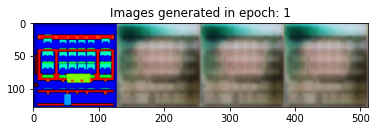

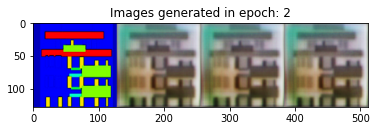

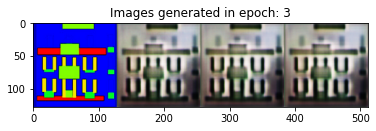

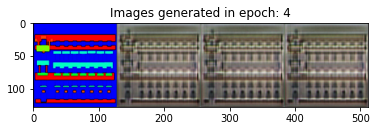

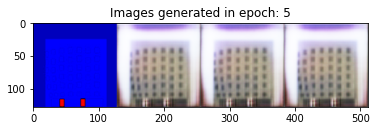

...

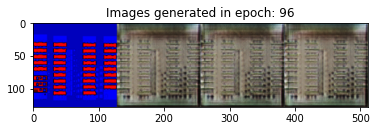

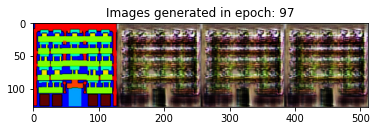

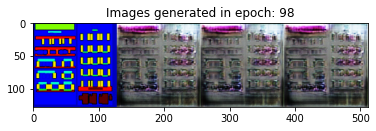

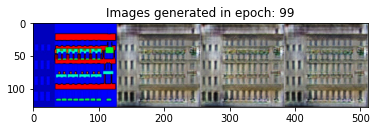

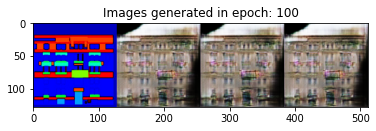

In [ ]:
# Visualizing generated images per epoch

arr = np.arange(1,NUM_EPOCHS+1)

for idx in range(len(arr)):
  i = arr[idx]
  gen_img_path = os.path.join(output_path, f'y_gen_{i}_0.png')
  
  gen_img = io.imread(gen_img_path)

  plt.title(f'Images generated in epoch: {i}')
  plt.imshow(gen_img)
  plt.show()

=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


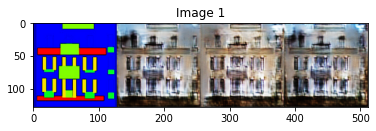

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


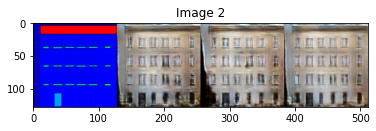

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


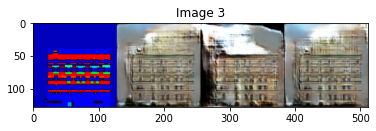

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


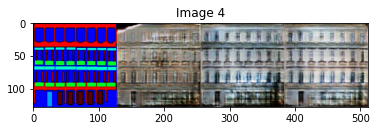

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


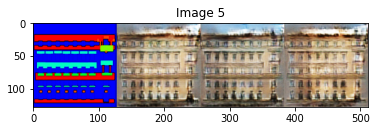

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


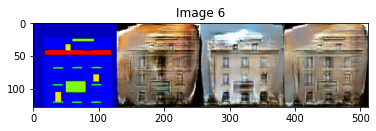

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


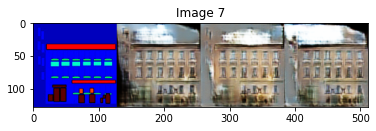

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


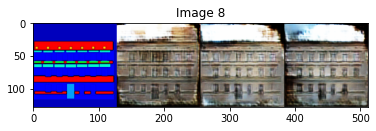

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


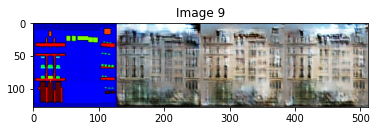

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


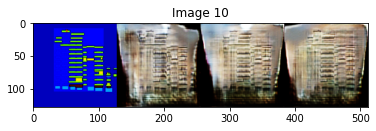

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


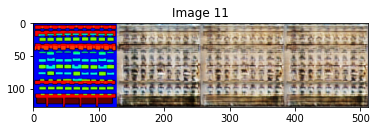

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


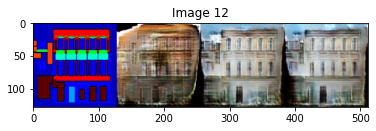

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


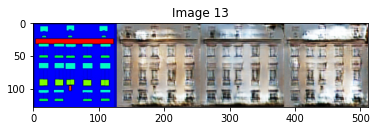

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


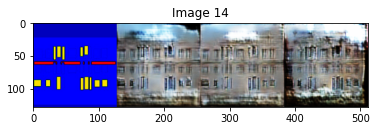

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


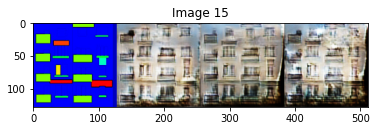

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


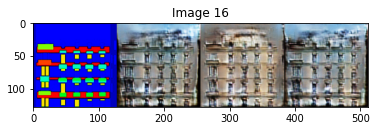

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


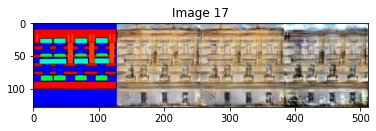

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


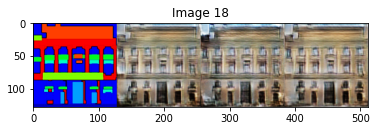

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


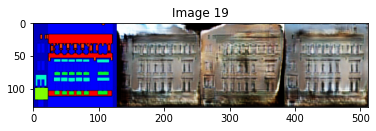

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


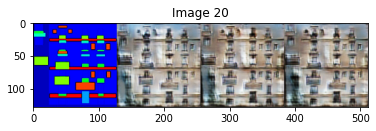

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


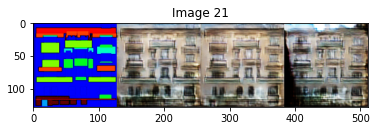

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


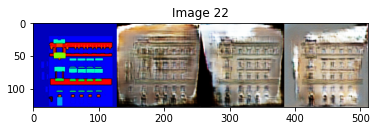

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


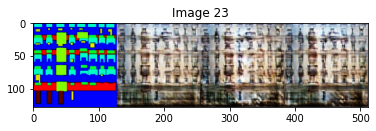

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


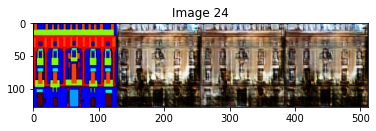

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


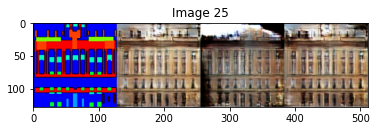

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


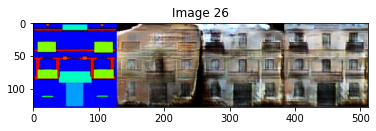

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


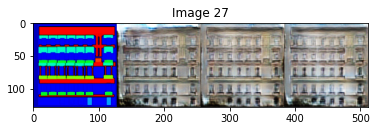

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


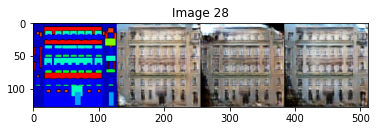

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


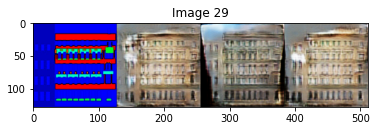

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


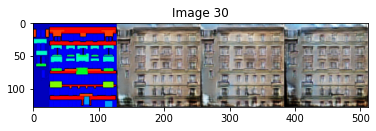

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


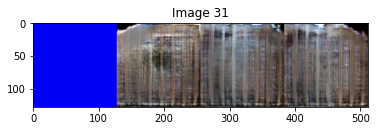

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


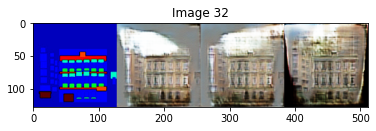

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


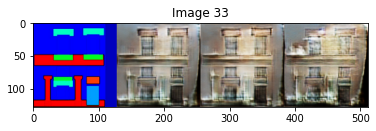

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


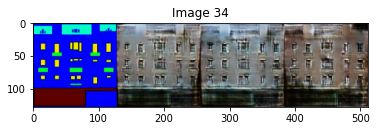

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


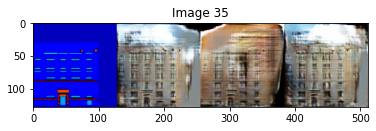

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


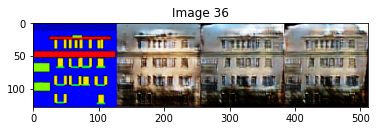

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


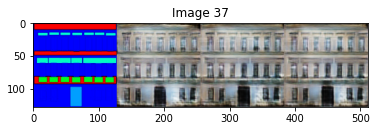

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


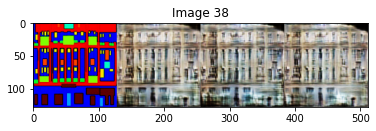

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


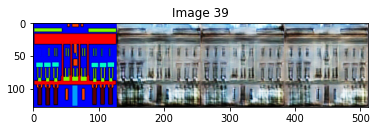

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


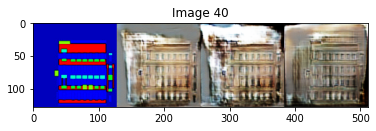

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


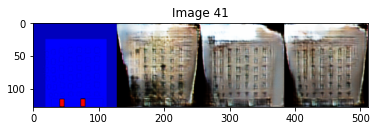

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


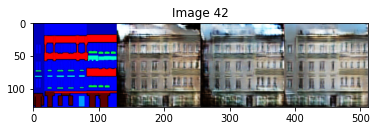

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


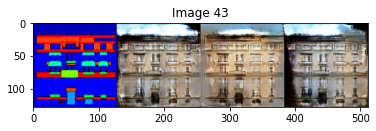

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


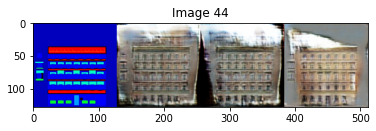

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


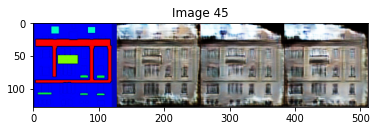

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


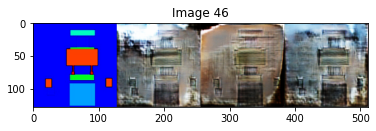

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


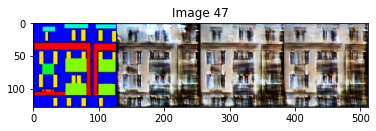

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


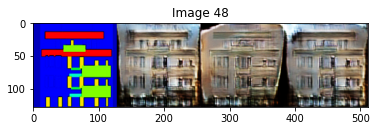

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


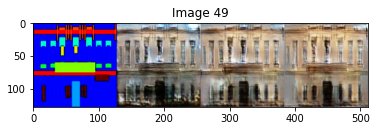

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


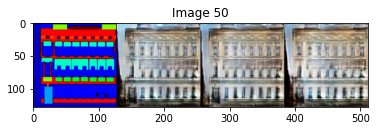

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


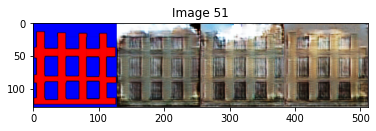

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


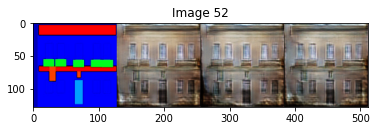

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


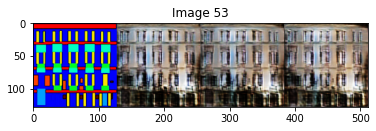

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


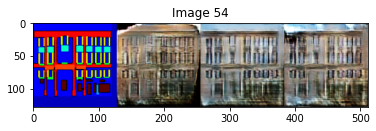

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


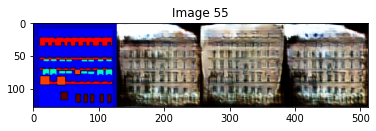

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


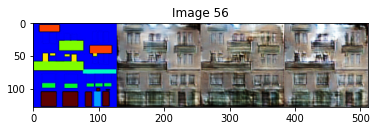

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


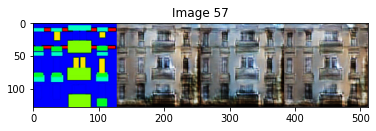

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


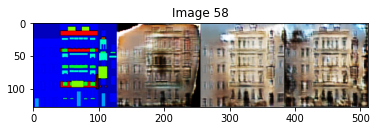

torch.Size([3, 128, 512])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


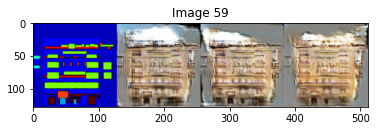

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


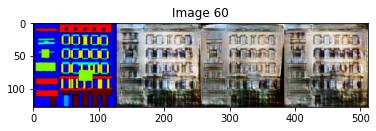

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


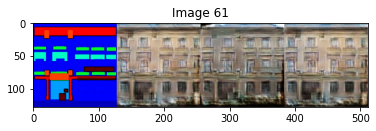

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


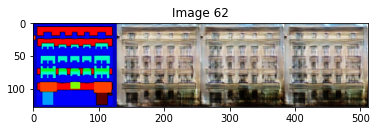

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


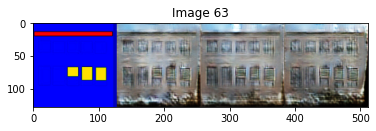

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


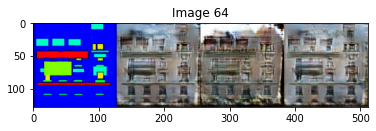

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


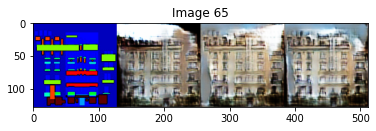

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


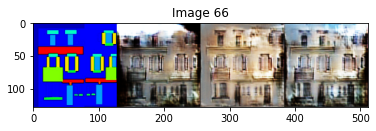

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


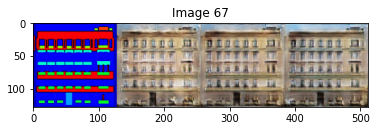

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


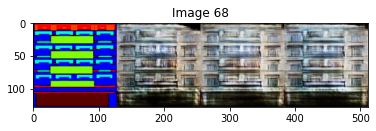

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


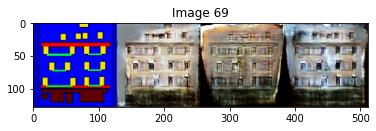

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


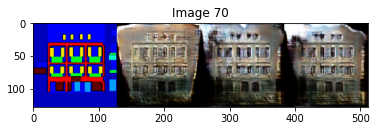

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


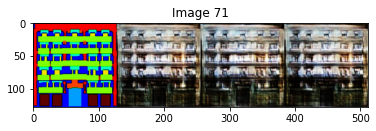

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


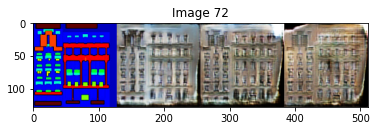

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


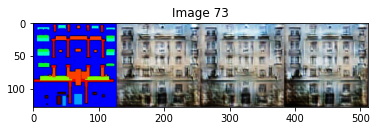

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


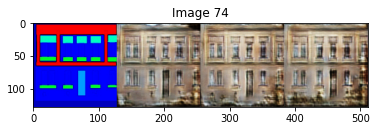

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


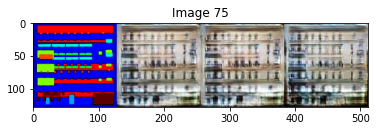

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


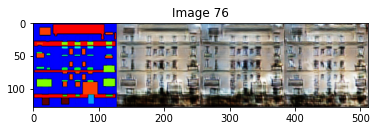

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


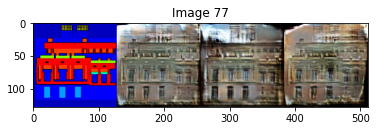

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


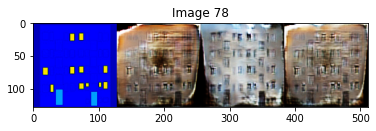

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


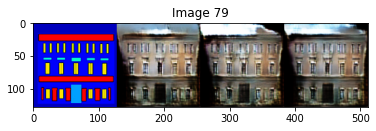

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


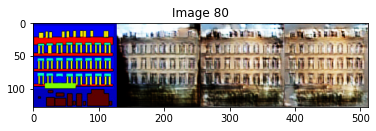

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


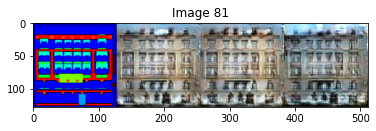

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


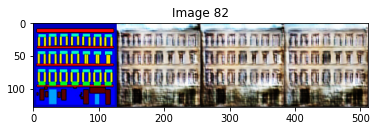

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


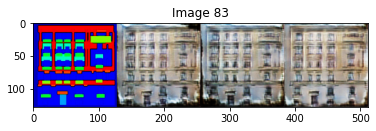

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


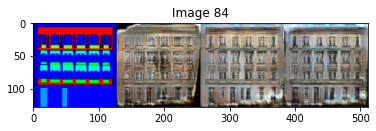

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


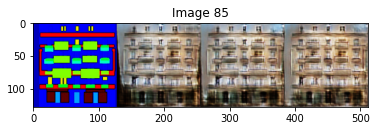

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


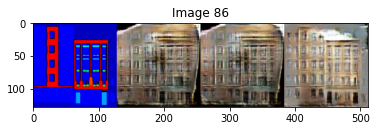

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


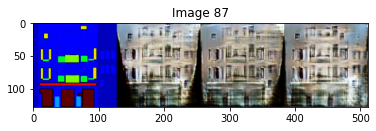

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


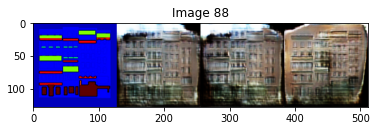

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


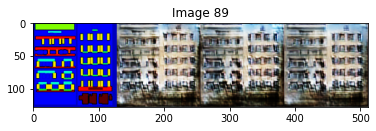

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


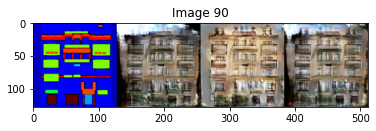

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


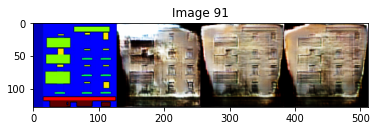

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


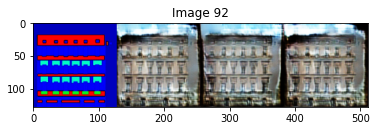

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


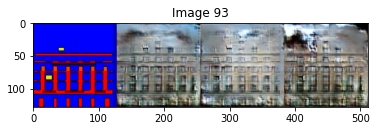

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


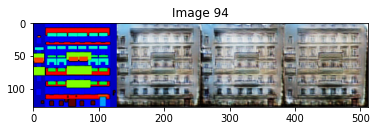

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


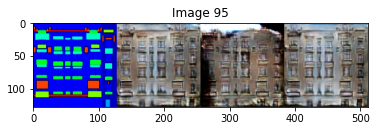

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


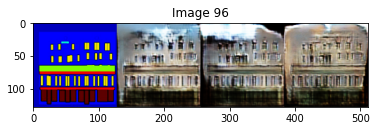

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


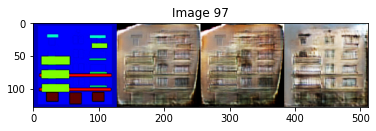

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


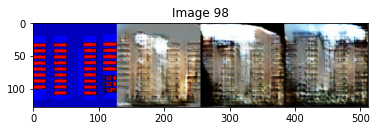

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


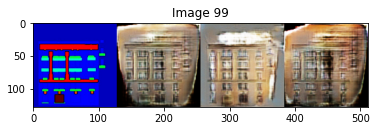

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 128, 512])


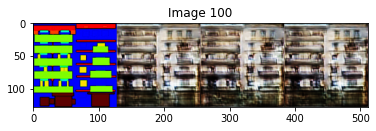

In [ ]:
# choosing trained model from observing images generated in epoch x 
epoch = 67
load_checkpoint(CHECKPOINT_GEN, gen, optimizer_G, epoch, LEARNING_RATE)
load_checkpoint(CHECKPOINT_DISC, disc, optimizer_D, epoch, LEARNING_RATE)
load_checkpoint(CHECKPOINT_ENC, enc, optimizer_E, epoch, LEARNING_RATE)

def generate_images_on_val_set():
  gen.eval()

  for i, (x,y) in enumerate(val_loader):
    x = Variable(x).to(DEVICE)
    y_real = Variable(y).to(DEVICE)

    sampled_z1 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake1 = gen(x, sampled_z1)[0]    
    y_fake1 = y_fake1 * 0.5 + 0.5

    sampled_z2 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake2 = gen(x, sampled_z2)[0]    
    y_fake2 = y_fake2 * 0.5 + 0.5

    sampled_z3 = Variable(Tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM))))
    y_fake3 = gen(x, sampled_z3)[0]
    y_fake3 = y_fake3 * 0.5 + 0.5

    concatenated_img = torch.cat([x[0],y_fake1,y_fake2,y_fake3], dim=2)
    print(concatenated_img.shape)
    plt.title(f'Image {i+1}')
    plt.imshow(concatenated_img.detach().cpu().numpy().transpose(1,2,0))
    plt.show()
  gen.train()

generate_images_on_val_set()

## Calculating FID Score using Inception v3 model

In [ ]:
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
  """Numpy implementation of the Frechet Distance.
  The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
  and X_2 ~ N(mu_2, C_2) is
          d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
  """

  mu1 = np.atleast_1d(mu1)
  mu2 = np.atleast_1d(mu2)

  sigma1 = np.atleast_2d(sigma1)
  sigma2 = np.atleast_2d(sigma2)

  assert mu1.shape == mu2.shape, \
      'Training and test mean vectors have different lengths'
  assert sigma1.shape == sigma2.shape, \
      'Training and test covariances have different dimensions'

  diff = mu1 - mu2

  
  covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
  if not np.isfinite(covmean).all():
      msg = ('fid calculation produces singular product; '
              'adding %s to diagonal of cov estimates') % eps
      print(msg)
      offset = np.eye(sigma1.shape[0]) * eps
      covmean = sqrtm((sigma1 + offset).dot(sigma2 + offset))

  
  if np.iscomplexobj(covmean):
      if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
          m = np.max(np.abs(covmean.imag))
          raise ValueError('Imaginary component {}'.format(m))
      covmean = covmean.real

  tr_covmean = np.trace(covmean)

  return (diff.dot(diff) + np.trace(sigma1) +
          np.trace(sigma2) - 2 * tr_covmean)

In [ ]:
import torchvision.models as models

In [ ]:
def get_inception():
  model = models.inception_v3(pretrained=True, aux_logits=False)

  # Freezing the model
  for param in model.parameters():
      param.requires_grad = False

  return model

In [ ]:
model = get_inception().to(DEVICE)

In [ ]:
epoch = 67
load_checkpoint(CHECKPOINT_GEN, gen, optimizer_G, epoch, LEARNING_RATE)
load_checkpoint(CHECKPOINT_DISC, disc, optimizer_D, epoch, LEARNING_RATE)
load_checkpoint(CHECKPOINT_ENC, enc, optimizer_E, epoch, LEARNING_RATE)

gen.eval()

R = torch.zeros((len(val_loader), 1000))
G = torch.zeros((len(val_loader), 1000))

for i, (x,y) in enumerate(val_loader):
  x = Variable(x).to(DEVICE)
  y_real = Variable(y).to(DEVICE)

  y_real_F = model(y_real)
  y_real_F = y_real_F.reshape(-1)
  sampled_z = torch.tensor(np.random.normal(0,1, (x.shape[0], LATENT_DIM)), dtype=torch.float32).to(DEVICE)
  y_fake = gen(x, sampled_z)[0]

  y_fake = y_fake.unsqueeze(0)

  y_fake_F = model(y_fake)
  y_fake_F = y_fake_F.reshape(-1)

  R[:,i] = y_real_F[0]
  G[:,i] = y_fake_F[0]


act1= R.data.numpy().reshape(R.size(0), -1)
mu1 = np.mean(act1, axis=0)
sigma1 = np.cov(act1, rowvar=False)

act2= G.data.numpy().reshape(G.size(0), -1)
mu2 = np.mean(act2, axis=0)
sigma2 = np.cov(act2, rowvar=False)


fid_value = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
print(fid_value)

22.623519897460938


/usr/local/lib/python3.7/dist-packages/scipy/linalg/_matfuncs_sqrtm.py:191: RuntimeWarning: invalid value encountered in double_scalars
  arg2 = norm(X.dot(X) - A, 'fro')**2 / norm(A, 'fro')
